# ANÁLISIS EXPLORATORIO DE LOS DATOS (EDA)

![Texto Alternativo](aves.png)

## Descripción de población y muestra

Para el desarrollo del presente proyecto, se eligió un conjunto de datos que contiene imágenes de espectrogramas previamente procesados, disponibles en el sitio web Kaggle. Los audios utilizados para generar los espectrogramas, fueron obtenidos del sitio web Xeno-Canto, en el cual se encuentran registros de sonidos de toda clase de fauna alrededor del mundo. Los audios con los cantos de las aves fueron convertidos en espectrogramas utilizando una transformada de Fourier de tamaño 2048 y luego se les aplicó una transformación logarítmica.

Los espectrogramas consisten en una representación visual que muestra cómo se distribuyen las frecuencias en una señal de sonido. Esta representación gráfica puede revelar detalles específicos, como frecuencias elevadas o cambios en la amplitud, que podrían no ser perceptibles incluso si se encuentran dentro del rango auditivo humano.

La muestra inicial de datos para este proyecto son espectrogramas de 152 especies de aves de la población total de especies de aves presentes alrededor del mundo, con audios tomados en distintas fechas y por diferentes autores.

Durante la realización del análisis exploratorio, y por limitaciones para aplicar técnicas de balanceo de datos, se seleccionan como muestra las 6 especies con mayor cantidad de datos.

### Diccionario de variables

Los datos utilizados en el proyecto son imágenes de espectrogramas de 152 especies de aves presentes alrededor del mundo. Como se verá más adelante, la cantidad de espectrogramas para cada especie no es igual, por lo que estamos ante un conjunto de datos desbalanceado.

- **Variable dependiente:** Etiquetas con la abreviatura del nombre común de las aves.

- **Variables explicativas:** Vector de características extraídas de imágenes de espectrogramas del espectro de frecuencias de la emisión sonora del canto de las aves.

Los espectrogramas, se utilizaron para extraer patrones visuales y características importantes presentes en las imágenes, que permitan identificar las especies de aves. Estas características son extraídas al momento de implementar los modelos, y no se tienen de antemano.

Algunas de las características extraídas de los espectrogramas por los modelos son:

- **Estadísticas de color:** Los estadísticos de distribución de color son comunes en la recuperación de imágenes, ya que describen la variación de la intensidad del color en una imagen. En el caso de los espectrogramas de sonido, estos estadísticos se aplican a cada imagen monocroma, permitiendo describir cómo varía la intensidad del sonido en regiones definidas en términos de tiempo y frecuencia.

- **Direccionalidad:** La direccionalidad de la imagen es una característica importante para describir la textura de una imagen. Describe la dirección en la que se concentra o dispersa la textura de la imagen.

Se tiene tambien metada sobre los audio de las aves, entre la cual se puede encontrar los siguientes datos:

- **primary_label:** representa el código de la especie de ave. Será la etiqueta que se utilice para identificar la especie.

- **secondary_labels:** especies de fondo anotadas por el autor de la grabación. Una lista vacía no significa que no haya aves de fondo audibles, solo que no fueron identificadas.

- **author:** el usuario de eBird que provee la grabación.

- **rating:** Valor flotante entre 0,0 y 5,0 como indicador de la calificación de calidad en Xeno-canto y el número de especies de fondo, donde 5,0 es el más alto y 1,0 el más bajo. 0,0 significa que esta grabación aún no tiene calificación de usuario.

- **type:** Detalles sobre el audio y la especie grabada. Puede tener información sobre el tipo de sonido emitido por la ave, canto o llamado, también información sexo del ave, o si es un adulto o juvenil, entre otro tipo de información.

- **latitude y longitude**: coordenadas geográficas del lugar donde fue grabado el audio.

- **scentific_name:** nombre científico de la ave.

- **common_name:** nombre común del ave en ingles.

- **time:** hora del día en la que fue tomada la grabación.-

## Analisis Exploratorio (EDA)

Para la exploración de los datos, se utilizaron los audios originales con los cuales se generaron los espectogramas, ya que estos nos podrian ayudar a entender las diferencias entre los cantos de las aves, y como esto puede ayudar a identificarlas. 

In [1]:
import os
import pandas as pd
import torch
import torchaudio
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import librosa
import librosa.display
import IPython.display as ipd
import sklearn
import warnings
import seaborn as sns
warnings.filterwarnings('ignore')
import altair as alt
import plotly.graph_objs as go
import re

In [2]:
#Metadata de los audios
train_csv=pd.read_csv(r'C:\Users\ANGIE VANESA\Documents\2023-2\2023-2 MAESTRIA\MACHINE LEARNING\BIRD_DATA\train_metadata.csv')
train_csv.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,time,url,filename
0,afrsil1,[],"['call', 'flight call']",12.3910,-1.4930,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,2.5,08:00,https://www.xeno-canto.org/125458,afrsil1/XC125458.ogg
1,afrsil1,"['houspa', 'redava', 'zebdov']",['call'],19.8801,-155.7254,Euodice cantans,African Silverbill,Dan Lane,Creative Commons Attribution-NonCommercial-Sha...,3.5,08:30,https://www.xeno-canto.org/175522,afrsil1/XC175522.ogg
2,afrsil1,[],"['call', 'song']",16.2901,-16.0321,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:30,https://www.xeno-canto.org/177993,afrsil1/XC177993.ogg
3,afrsil1,[],"['alarm call', 'call']",17.0922,54.2958,Euodice cantans,African Silverbill,Oscar Campbell,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:00,https://www.xeno-canto.org/205893,afrsil1/XC205893.ogg
4,afrsil1,[],['flight call'],21.4581,-157.7252,Euodice cantans,African Silverbill,Ross Gallardy,Creative Commons Attribution-NonCommercial-Sha...,3.0,16:30,https://www.xeno-canto.org/207431,afrsil1/XC207431.ogg


La metadata contiene 14 columnas de información y 14852 registros

In [3]:
train_csv.shape

(14852, 13)

In [4]:
train_csv.columns

Index(['primary_label', 'secondary_labels', 'type', 'latitude', 'longitude',
       'scientific_name', 'common_name', 'author', 'license', 'rating', 'time',
       'url', 'filename'],
      dtype='object')

- Verificación de datos faltantes:

In [5]:
missing_data=train_csv.isnull().sum()
missing_data

primary_label       0
secondary_labels    0
type                0
latitude            0
longitude           0
scientific_name     0
common_name         0
author              0
license             0
rating              0
time                0
url                 0
filename            0
dtype: int64

La información de la metadata del conjunto de datos, tiene información sobre el tipo de canto de la especie (llamado, canción, alerta), las coordenadas en las cuales se realizó la grabación del audio, quien fue el autor de la grabación, la duración de la grabación, entre otros datos.

In [6]:
train_csv.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,14852.0,35.778958,22.288169,-71.8834,28.2592,40.8708,51.12195,78.9783
longitude,14852.0,-30.217719,73.679144,-176.6322,-96.1643,-6.0611,10.89780,179.3607
rating,14852.0,3.719129,1.181014,0.0000,3.0000,4.0000,4.50000,5.0000


In [7]:
train_csv.describe(include=object).T

,count,unique,top,freq
primary_label,14852,152,brnowl,500
secondary_labels,14852,273,[],13374
type,14852,1157,['call'],3910
scientific_name,14852,152,Tyto alba,500
common_name,14852,152,Barn Owl,500
author,14852,1356,Paul Marvin,947
license,14852,4,Creative Commons Attribution-NonCommercial-Sha...,12742
time,14852,1553,09:00,514
url,14852,14850,https://www.xeno-canto.org/501149,2
filename,14852,14852,afrsil1/XC125458.ogg,1


### ANÁLISIS EXPLORATORIO UNIVARIADO

#### **primary_label**

Esta variable representa un código de identificación de todas las especies registradas en la muestra. El siguiente diagrama de barras nos muestra las frecuencias de cada especie en la muestra según su etiqueta principal:

In [8]:
etiquetas_birds =pd.DataFrame(train_csv['primary_label'].value_counts()) 
fig = px.bar(etiquetas_birds, x=etiquetas_birds.index, y='count',title = "Cantidad de especies en la muestra", color_continuous_scale='viridis', color='count')
fig.update_layout(width=900, height=600)
fig.show()

Se puede observar, que la gran mayoría de especies cuentan con menos de 100 espectrogramas en el conjuntos de datos, algunas incluso tienen menos de 10 especies, lo que indica que el conjunto de datos esta considerablemente desbalanceado. Se tiene 152 tipos de especies en total.

In [9]:
print(len(etiquetas_birds))

152


### ESPECIES

Las especies seleccionadas para la clasificación son: 

In [10]:
birds= ['brnowl', 'comsan', 'houspa', 'mallar3', 'norcar','skylar']
birds

['brnowl', 'comsan', 'houspa', 'mallar3', 'norcar', 'skylar']

#### Descripción:

#### Tyto alba

![Texto Alternativo](Tyto_alba.jpg)

Búho pálido, blanco abajo y anaranjado con manchas grises arriba. Disco facial en forma de corazón blanco. Caza principalmente roedores en áreas abiertas por la noche. Duerme en edificios viejos y cajas de nidos durante el día. Ampliamente distribuido en todos los continentes, excepto en la Antártica. Por la noche, parece muy blanco en faros. Su llamado es apropiado para Halloween: un chillido escalofriante.

#### Actitis hypoleucos

![Texto Alternativo](Actitis_hypoleucos.jpg)

Migradora parcial en la península ibérica con individuos invernantes, en paso e incluso veraneantes procedentes de las poblaciones europeas del norte y centro. Escasa población reproductora. Aparecen en una amplia variedad de hábitat acuáticos, pero selecciona para reproducirse orillas pedregosas de ríos o lagos. Generalmente individuos solitarios, pero también pueden observarse pequeños grupos. Evita bandos mixtos con otras especies. Camina con un distintivo y constante movimiento “arriba-abajo” de la cola, tipo wagtail. Tiene plumaje pardusco en el dorso, donde destaca el plumaje blanco del hombro que se ve como una pequeña franja blanca entre el ala plegada y el pecho.

#### Anas platyrhynchos

![Texto Alternativo](Anas_platyrhynchos.jpg)

El típico pato dentro de su rango, se encuentra en cualquier lugar donde hay agua, incluyendo parques de ciudades, arroyos en el jardín y diferentes humedales. Los machos tienen cabeza verde, pecho castaño y cuerpo gris. Las hembras son marrones moteadas con manchas anaranjadas y negras en el pico. Las barras blancas enfrente y atrás del parche azul del ala son más conspicuas comparadas a las de American Black Duck y el Mottled Duck.

#### Alauda arvensis

![Texto Alternativo](Alauda_arvensis.jpg)

Bastante común en campos abiertos, especialmente pastizales en terrenos escabrosos, páramos, tierras de cultivo, aeropuertos. Como la mayoría de los aláudidos, normalmente es poco visible en el suelo y mejor detectada por la voz. Posee un canto prolongado en vuelo, compuesto de gorjeos y trinos, a menudo tan alto que apenas se ve una mancha en el cielo, si es que está visible. Si está posada, destaca el plumaje rayado marrón, cresta tupida distintiva, y anillo ocular ancho, difuso y pálido. Más corpulenta que un bisbita pero y a diferencia de ésta no suele menear su parte trasera. En vuelo muestra lados blancos de la cola, así como un borde posterior blanco y estrecho en las alas.

#### Cardinalis

![Texto Alternativo](Cardinalis.jpeg)

El cardenal norteño es un pájaro cantor de tamaño medio con una longitud corporal de 21-23 cm. Tiene un distintivo penacho y una máscara en la cara que es negra en el macho y gris en la hembra. Presenta dimorfismo sexual en su coloración; el plumaje del macho es rojo brillante, mientras que el de la hembra es de un tono opaco que mezcla rojo y café. El cardenal norteño es predominantemente granívoro, pero también se alimenta de insectos y fruta. El macho tiene un comportamiento territorial, delimitando su territorio con su canto

#### Passer domesticus

![Texto Alternativo](Passer_domesticus.jpeg)

Ampliamente distribuido y abundante en ciudades, vecindarios y granjas. Evita bosques densos. Las bandadas se agrupan en densos arbustos, moviéndose y vocalizando entre ellos. Los machos tienen baberos negros elegantes, nuca rufa brillante, y alas con brillantes tonos marrones y caqui. Las partes inferiores son gris pálido. Las hembras son marrón uniforme con una cara linda y ceja más clara. Nativo de Eurasia; introducido a Norteamérica y no está estrechamente relacionado con otros gorriones de allí.

Filtramos la data para obtener los registros de las especies que nos interesan, como también aquellas columnas con información relevante:

In [11]:
Sub_data=train_csv.drop(columns=['secondary_labels','type', 'author', 'license','url',
                                 'filename']).loc[train_csv['primary_label'].isin(birds)]

In [12]:
Sub_data.head()

,primary_label,latitude,longitude,scientific_name,common_name,rating,time
1663,brnowl,52.3009,6.7620,Tyto alba,Barn Owl,4.0,21:30
1664,brnowl,-20.7900,-42.8882,Tyto alba,Barn Owl,4.0,20:30
1665,brnowl,18.5206,73.8398,Tyto alba,Barn Owl,4.0,23:09
1666,brnowl,-21.5500,-47.7167,Tyto alba,Barn Owl,4.0,05:30
1667,brnowl,0.0640,32.4790,Tyto alba,Barn Owl,4.0,23:30


In [13]:
Sub_data.rename(columns={'primary_label':'etiqueta', 'latitude':'latitud',
                         'longitude':'longitud', 'scientific_name':'Nombre_cientifico',
                         'common_name':'Nombre_comun', 'time':'tiempo'}, inplace=True)

In [14]:
Sub_data.reset_index(drop=True, inplace=True)

In [15]:
Sub_data.head()

,etiqueta,latitud,longitud,Nombre_cientifico,Nombre_comun,rating,tiempo
0,brnowl,52.3009,6.7620,Tyto alba,Barn Owl,4.0,21:30
1,brnowl,-20.7900,-42.8882,Tyto alba,Barn Owl,4.0,20:30
2,brnowl,18.5206,73.8398,Tyto alba,Barn Owl,4.0,23:09
3,brnowl,-21.5500,-47.7167,Tyto alba,Barn Owl,4.0,05:30
4,brnowl,0.0640,32.4790,Tyto alba,Barn Owl,4.0,23:30


Se tienen 3000 registros en total de seis especies de aves:

In [16]:
Sub_data.shape

(3000, 7)

In [17]:
Sub_data1=train_csv.drop(columns=[ 'author', 'license','url',
                                 'filename']).loc[train_csv['primary_label'].isin(birds)]

In [18]:
Sub_data1.rename(columns={'primary_label':'etiqueta', 'latitude':'latitud',
                         'longitude':'longitud', 'scientific_name':'Nombre_cientifico',
                         'common_name':'Nombre_comun', 'time':'tiempo', 'secondary_labels':'etiqueta_2'}, inplace=True)

In [19]:
Sub_data1.reset_index(drop=True, inplace=True)
Sub_data1.head()

,etiqueta,etiqueta_2,type,latitud,longitud,Nombre_cientifico,Nombre_comun,rating,tiempo
0,brnowl,[],['alarm call'],52.3009,6.7620,Tyto alba,Barn Owl,4.0,21:30
1,brnowl,[],['song'],-20.7900,-42.8882,Tyto alba,Barn Owl,4.0,20:30
2,brnowl,[],['call'],18.5206,73.8398,Tyto alba,Barn Owl,4.0,23:09
3,brnowl,[],"['', 'clicks']",-21.5500,-47.7167,Tyto alba,Barn Owl,4.0,05:30
4,brnowl,[],['begging call'],0.0640,32.4790,Tyto alba,Barn Owl,4.0,23:30


### Distribución de los datos

#### Primary_label

Vemos que las 6 especies tienen registros balanceados en la muestra:

In [20]:
fig = px.bar(Sub_data['etiqueta'].value_counts(), 
             x=Sub_data['etiqueta'].value_counts().index, 
             y=Sub_data['etiqueta'].value_counts().values, 
             labels={'x': 'Especies', 'y': 'Frecuencia'},
             title='Conteo de Especies',
             color_discrete_sequence=['#34D9C6'])

fig.update_layout(xaxis_title='Especies', yaxis_title='Frecuencia', xaxis=dict(categoryorder='total descending'),height=500, width=700)

fig.show()

#### secondary_labels

In [21]:
Sub_data1['etiqueta_2'] = Sub_data1['etiqueta_2'].apply(lambda x: re.sub(r'[\[\]\'\"]', '', x))
Sub_data1['et2_count'] = Sub_data1['etiqueta_2'].apply(lambda x: 0 if x == '' else len(x.split(',')))
resumen = pd.DataFrame(Sub_data1['et2_count'].value_counts())
resumen

,count
et2_count,
0,2814
1,165
2,16
3,3
4,2


La mayoría de audios no registran sonidos de más de una especie de ave.

#### Rating

La variable de rating permite identificar la calidad que tiene el audio con referencia al sonido emitido por el ave. En el siguiente grafico se puede observar, que la mayoría de audios tienen un puntaje de 4, seguido por un puntaje de 5, lo que indica que los audios con los que se trabajará son adecuados para entrenar el modelo predictivo.

In [22]:
fig = px.bar(Sub_data1['rating'].value_counts().sort_index(), 
             x=Sub_data1['rating'].value_counts().sort_index().index, 
             y=Sub_data1['rating'].value_counts().sort_index().values, 
             labels={'x': 'Rating', 'y': 'Frecuencia'},
             title='Puntaje de audios',
             color_discrete_sequence=['#34D9C6'])

fig.update_layout(xaxis_title='Rating', yaxis_title='Frecuencia', xaxis=dict(categoryorder='total ascending'),
                  height=600, width=800) 

fig.show()


- **Rating: Indicador de la calificación de calidad en Xeno-canto**

Podemos ver en el siguiente diagrama de cajas que las grabaciones registradas por especie tienen en general una calificación de calidad por encima de tres. Se observan algunos datos atípicos. Para la especie **brnowl**, el 50% de las grabaciones tienen una calificación sobre 4, mientras que las un 50% de las grabaciones para las especies **comsan**, **houspa**, **mallar3** y **norcar** tiene calificaciones entre 3 a 4.5 aproximadamente. La especie **skylar** tiene un 75% de los registros de audio con calificaciones inferiores a 4, esto es importante ya que nos interesa aplicar modelos de clasificación sobre estos audios y la calidad de la grabación podría influir en la clasificación de esta especie en el modelo. 

In [23]:
fig = px.box(Sub_data1, x='rating', y='etiqueta',
             title='Boxplot de Rating por Etiqueta',
             color='etiqueta')

fig.update_layout(height=600, width=800) 
fig.show()


#### Type: Tipo de sonido

Esta variable contiene detalles sobre el audio y y el ave presente en el. Se puede encontrar información como el tipo de vocalización emitida por el ave (canto o llamado), el sexo del ave, o en que etapa se encuentra (adulto o juvenil), entre otra información referente a los sonidos que se pueden escuchar en el audio.

- Limpieza de la variable **Type**:

In [24]:
Sub_data1['type'] = Sub_data1['type'].apply(lambda x: re.sub(r'[\[\]\'\"]', '', x)).str.lower()
Sub_data1.head()

,etiqueta,etiqueta_2,type,latitud,longitud,Nombre_cientifico,Nombre_comun,rating,tiempo,et2_count
0,brnowl,,alarm call,52.3009,6.7620,Tyto alba,Barn Owl,4.0,21:30,0
1,brnowl,,song,-20.7900,-42.8882,Tyto alba,Barn Owl,4.0,20:30,0
2,brnowl,,call,18.5206,73.8398,Tyto alba,Barn Owl,4.0,23:09,0
3,brnowl,,", clicks",-21.5500,-47.7167,Tyto alba,Barn Owl,4.0,05:30,0
4,brnowl,,begging call,0.0640,32.4790,Tyto alba,Barn Owl,4.0,23:30,0


In [25]:
Sub_data1['type'] = Sub_data1['type'].str.strip()
Sub_data1.head()

,etiqueta,etiqueta_2,type,latitud,longitud,Nombre_cientifico,Nombre_comun,rating,tiempo,et2_count
0,brnowl,,alarm call,52.3009,6.7620,Tyto alba,Barn Owl,4.0,21:30,0
1,brnowl,,song,-20.7900,-42.8882,Tyto alba,Barn Owl,4.0,20:30,0
2,brnowl,,call,18.5206,73.8398,Tyto alba,Barn Owl,4.0,23:09,0
3,brnowl,,", clicks",-21.5500,-47.7167,Tyto alba,Barn Owl,4.0,05:30,0
4,brnowl,,begging call,0.0640,32.4790,Tyto alba,Barn Owl,4.0,23:30,0


##### Sexo

Del campo type, se extrae el sexo del ave. Se tienen 4 categorias para esta nueva variable: Hembra, Macho, Ambos y No Especifica. La categoría Ambos, indica que hay tanto una hembra como un macho en el audio.

In [26]:
Sub_data1['Sexo']= np.select(
        [
        Sub_data1['type'].apply(lambda types: 'female' in types and 'male' in types),
        Sub_data1['type'].apply(lambda types: 'female' in types),
        Sub_data1['type'].apply(lambda types: 'male' in types)
    ],
    ["Ambos", "Hembra", "Macho"],
    default="No Especifica"
)

In [27]:
Sub_data1['Sexo'].value_counts()

Sexo
No Especifica    2350
Macho             388
Ambos             262
Name: count, dtype: int64

In [28]:
fig = px.bar(Sub_data1['Sexo'].value_counts(), 
             x=Sub_data1['Sexo'].value_counts().index, 
             y=Sub_data1['Sexo'].value_counts().values, 
             labels={'x': 'Sexo', 'y': 'Frecuencia'},
             title='Sexo del ave',
             color_discrete_sequence=['#34D9C6'])

fig.update_layout(xaxis_title='Sexo', yaxis_title='Frecuencia', xaxis=dict(categoryorder='total descending'),
                  height=400, width=600)  
fig.show()

Identificamos el sexo por especie de ave obteniéndose:

In [29]:
sexo_especie = Sub_data1[['Sexo', 'etiqueta']].groupby(['etiqueta', 'Sexo']).size().reset_index(name='count')

fig = px.bar(sexo_especie, 
             x='count', 
             y='Sexo', 
             color='etiqueta',
             labels={'count': 'Conteo', 'etiqueta': 'Especie', 'Sexo': 'Sexo'},
             title='Gráfico de Barras por especie y sexo',
             color_discrete_sequence=px.colors.qualitative.Set2)

fig.update_layout(barmode='group', height=600, width=800)

fig.show()

##### Edad

Otro campo que se extrae de la variable type es la edad del ave. Por edad se refiere a si el ave esta en etapa juvenil o es un adulto. Tambien se tiene una categoría en caso no se especifique la edad del ave.

In [30]:
Sub_data1['Edad']= np.select(
        [
        Sub_data1['type'].apply(lambda types: 'adult' in types),
        Sub_data1['type'].apply(lambda types: 'juvenile' in types),
    ],
    ["Adulto", "Joven"],
    default="No Especifica"
)

In [31]:
Sub_data1['Edad'].value_counts()

Edad
No Especifica    2627
Adulto            290
Joven              83
Name: count, dtype: int64

Vemos que grán parte de los registros no especifican la edad del ave.

In [32]:
fig = px.bar(Sub_data1['Edad'].value_counts(), 
             x=Sub_data1['Edad'].value_counts().index, 
             y=Sub_data1['Edad'].value_counts().values, 
             labels={'x': 'Edad', 'y': 'Frecuencia'},
             title='Edad del ave',
             color_discrete_sequence=['#34D9C6'])

fig.update_layout(xaxis_title='Edad', yaxis_title='Frecuencia', xaxis=dict(categoryorder='total descending'),
                  height=400, width=600)  
fig.show()

In [33]:
edad_especie = Sub_data1[['Edad', 'etiqueta']].groupby(['etiqueta', 'Edad']).size().reset_index(name='count')

fig = px.bar(edad_especie, 
             x='count', 
             y='Edad', 
             color='etiqueta',
             labels={'count': 'Conteo', 'etiqueta': 'Especie', 'Edad': 'Edad'},
             title='Gráfico de Barras por especie y edad',
             color_discrete_sequence=px.colors.qualitative.Set2)

fig.update_layout(barmode='group', height=600, width=800)

fig.show()

Similar a la variable sexo, para la mayoría de audios no se especifica la edad del ave. La mayoría de aves en las que se logra identificar la edad, son adultos.

##### Tipo de vocalización

Otro campo que se logra extraer de la variable type, es el tipo de vocalización del ave. Las vocalizaciones de las aves se puede dividir principalmente en 2 categorías: canto y llamado.

 Ambos tipos de vocalizaciones están conformadas por unidades de sonido conocidas como sílabas (similar al lenguaje humano), las cuales pueden ser simples o complejas; es decir, pueden estar conformadas por uno o varios elementos que son las unidades más pequeñas de una vocalización, con frecuencias moduladas o tonos puros, con elementos repetidos a gran velocidad (trinos), o sin ellos.



In [34]:
Sub_data1['Vocalizacion']= np.select(
        [
        Sub_data1['type'].apply(lambda types: 'call' in types),
        Sub_data1['type'].apply(lambda types: 'song' in types)
    ],
    ["Llamado", "Canto"],
    default="No Especifica"
)

In [35]:
Sub_data1['Vocalizacion'].value_counts()

Vocalizacion
Llamado          2126
Canto             814
No Especifica      60
Name: count, dtype: int64

In [36]:
fig = px.bar(Sub_data1['Vocalizacion'].value_counts(), 
             x=Sub_data1['Vocalizacion'].value_counts().index, 
             y=Sub_data1['Vocalizacion'].value_counts().values, 
             labels={'x': 'Vocalizacion', 'y': 'Frecuencia'},
             title='Tipo de vocalización del ave',
             color_discrete_sequence=['#34D9C6'])

fig.update_layout(xaxis_title='Vocalizacion', yaxis_title='Frecuencia', xaxis=dict(categoryorder='total descending'),
                  height=400, width=600)  
fig.show()

Vemos que la gran parte de los registros están etiquetados con tipo de vocalización "Llamado"

In [37]:
type_voice = Sub_data1[['Vocalizacion', 'etiqueta']].groupby(['etiqueta', 'Vocalizacion']).size().reset_index(name='count')

fig = px.bar(type_voice, 
             x='count', 
             y='Vocalizacion', 
             color='etiqueta',
             labels={'count': 'Conteo', 'etiqueta': 'Especie', 'Vocalizacion': 'Vocalización'},
             title='Gráfico de barras: Tipo de vocalización por especie',
             color_discrete_sequence=px.colors.qualitative.Set2)

fig.update_layout(barmode='group', height=600, width=800)

fig.show()

Las especies con mayor registro de tipo de vocalización **"Llamado"** son: mallar3, comsan y houspa. Hay varios registros de **"Canto"** en las especies skylar , norcar y houspa. 

### Tiempo

Esta variable representa la hora del día en la que se registró la grabación. Con base en esta variable, se creará una variable categórica que indique el momento del día en que se tomo la grabación: madrugada, mañana, tarde, noche.

In [38]:
Sub_data1['Tiempo_hr']=pd.to_datetime(Sub_data1['tiempo'],errors='coerce')
Sub_data1['Tiempo_hr'] = Sub_data1['Tiempo_hr'].dt.hour
Sub_data1.head()

,etiqueta,etiqueta_2,type,latitud,longitud,Nombre_cientifico,Nombre_comun,rating,tiempo,et2_count,Sexo,Edad,Vocalizacion,Tiempo_hr
0,brnowl,,alarm call,52.3009,6.7620,Tyto alba,Barn Owl,4.0,21:30,0,No Especifica,No Especifica,Llamado,21.0
1,brnowl,,song,-20.7900,-42.8882,Tyto alba,Barn Owl,4.0,20:30,0,No Especifica,No Especifica,Canto,20.0
2,brnowl,,call,18.5206,73.8398,Tyto alba,Barn Owl,4.0,23:09,0,No Especifica,No Especifica,Llamado,23.0
3,brnowl,,", clicks",-21.5500,-47.7167,Tyto alba,Barn Owl,4.0,05:30,0,No Especifica,No Especifica,No Especifica,5.0
4,brnowl,,begging call,0.0640,32.4790,Tyto alba,Barn Owl,4.0,23:30,0,No Especifica,No Especifica,Llamado,23.0


In [39]:
Sub_data1['etapaDia'] = np.select(
    [
        (Sub_data1['Tiempo_hr'] >= 0) & (Sub_data1['Tiempo_hr'] <= 6),
        (Sub_data1['Tiempo_hr'] > 6) & (Sub_data1['Tiempo_hr'] <= 12),
        (Sub_data1['Tiempo_hr'] > 12) & (Sub_data1['Tiempo_hr'] <= 18),
        (Sub_data1['Tiempo_hr'] > 18)
    ],
    ['Madrugada', 'Mañana', 'Tarde', 'Noche'],
    default='No especifica'
)

In [40]:
fig = px.bar(Sub_data1['etapaDia'].value_counts(), 
             x=Sub_data1['etapaDia'].value_counts().index, 
             y=Sub_data1['etapaDia'].value_counts().values, 
             labels={'x': 'etapaDia', 'y': 'Frecuencia'},
             title='Etapa del día de las grabaciones del sonido de aves',
             color_discrete_sequence=['#34D9C6'])

fig.update_layout(xaxis_title='Etapa del día', yaxis_title='Frecuencia', xaxis=dict(categoryorder='total descending'),
                  height=400, width=600)  
fig.show()

Vemos que gran parte de los registros fueron realizados en la mañana y en la madrugada.

In [41]:
etapa_grab = Sub_data1[['etapaDia', 'etiqueta']].groupby(['etiqueta', 'etapaDia']).size().reset_index(name='count')

fig = px.bar(etapa_grab, 
             x='etapaDia', 
             y='count', 
             color='etiqueta',
             labels={'count': 'Conteo', 'etiqueta': 'Especie', 'Vocalizacion': 'Vocalización'},
             title='Momento del día en que se hizo la grabación por tipo de especie de ave',
             color_discrete_sequence=px.colors.qualitative.Set2)

fig.update_layout(barmode='group', height=600, width=800)

fig.show()

vemos que para las especies brnowl y comsan, la mayoría de registros de audio se hicieron en la madrugada; mientras que para las especies houspa, norcar, mallar3 y skylar ,fueron en la mañana.

### Muestras de audios

In [42]:
base_dir = 'C:\\Users\\ANGIE VANESA\\Documents\\2023-2\\2023-2 MAESTRIA\MACHINE LEARNING\\train_audio'
train_csv['full_path'] = base_dir+ '/' + train_csv['filename']
# train_csv['full_path'] = base_dir+ '/' + train_csv['primary_label'] + '/' + train_csv['filename']
brnowl = train_csv[train_csv['primary_label'] == "brnowl"].sample(1, random_state = 33)['full_path'].values[0]
comsan = train_csv[train_csv['primary_label'] == 'comsan'].sample(1, random_state = 33)['full_path'].values[0]
houspa = train_csv[train_csv['primary_label'] == "houspa"].sample(1, random_state = 33)['full_path'].values[0]
mallar3 = train_csv[train_csv['primary_label'] == 'mallar3'].sample(1, random_state = 33)['full_path'].values[0]
norcar = train_csv[train_csv['primary_label'] == 'norcar'].sample(1, random_state = 33)['full_path'].values[0]
skylar = train_csv[train_csv['primary_label'] == 'skylar'].sample(1, random_state = 33)['full_path'].values[0]

Para entender porque los cantos de las aves pueden ayudar en la identificación de especies, se muestran a continuación algunos ejemplos de audio obtenidos desde el repositorio de Xeno-canto.

In [43]:
ipd.Audio(houspa)

In [44]:
ipd.Audio(comsan)

In [45]:
ipd.Audio(mallar3)

In [46]:
ipd.Audio(norcar)

In [47]:
ipd.Audio(skylar)

### Visualización de ondas de sonido

Para una muestra de 6 especies, se grafican las ondas sonoras extraídas de los audios. Aqui se observa que los audios tienen diferentes duraciones, desde segundos hasta minutos, y que la amplitud y frecuencia de las ondas es diferente de una especie a otra.

In [48]:
y_brnowl, sr_brnowl = librosa.load(brnowl)
audio_brnowl, _ = librosa.effects.trim(y_brnowl)

y_comsan, sr_comsan = librosa.load(comsan)
audio_comsan, _ = librosa.effects.trim(y_comsan)

y_houspa , sr_houspa  = librosa.load(houspa)
audio_houspa , _ = librosa.effects.trim(y_houspa)

y_mallar3, sr_mallar3 = librosa.load(mallar3)
audio_mallar3, _ = librosa.effects.trim(y_mallar3)

y_norcar, sr_norcar = librosa.load(norcar)
audio_norcar, _ = librosa.effects.trim(y_norcar)

y_skylar, sr_skylar = librosa.load(skylar)
audio_skylar, _ = librosa.effects.trim(y_skylar)

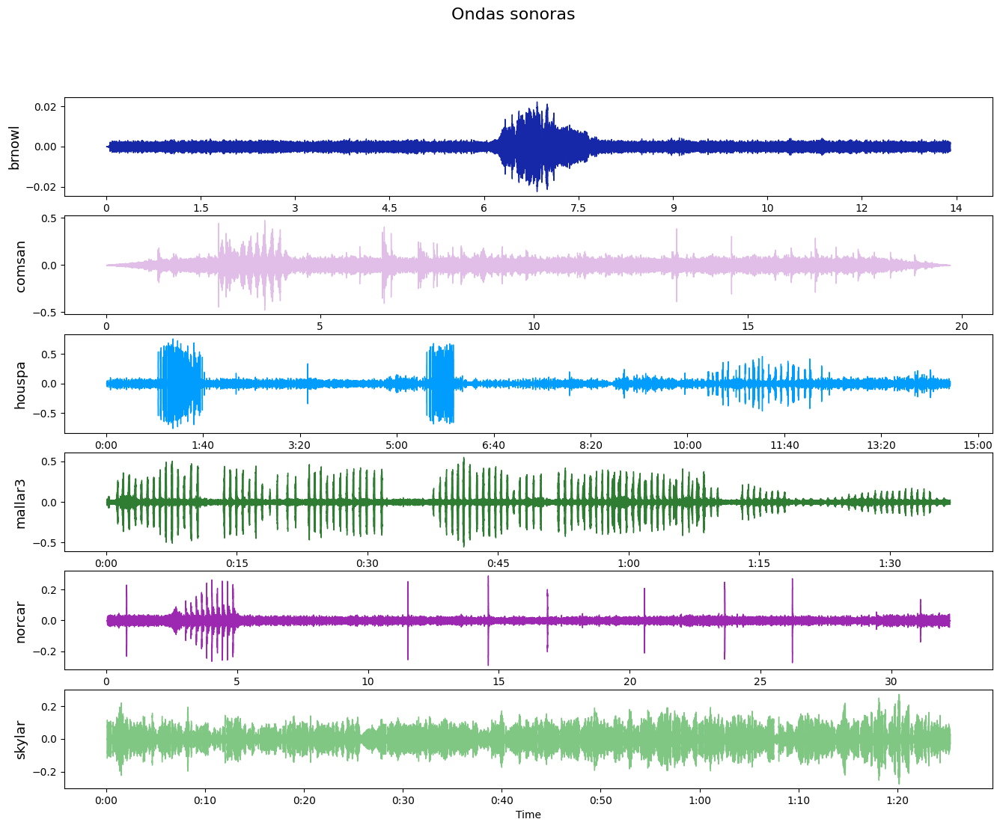

In [49]:
# graficas de señales de audio
fig, ax = plt.subplots(6, figsize = (16, 12))
fig.suptitle('Ondas sonoras', fontsize=16)
# birds= ["brnowl", "comsan", "houspa ", "mallar3", "norcar",'skylar']
librosa.display.waveshow(y = audio_brnowl, sr = sr_brnowl, color = "#1628a8", ax=ax[0])
librosa.display.waveshow(y = audio_comsan, sr = sr_comsan, color = "#E1BEE7", ax=ax[1])
librosa.display.waveshow(y = audio_houspa , sr = sr_houspa , color = "#009DFF", ax=ax[2])
librosa.display.waveshow(y = audio_mallar3, sr = sr_mallar3, color = "#2E7D32", ax=ax[3])
librosa.display.waveshow(y = audio_norcar, sr = sr_norcar, color = "#9C27B0", ax=ax[4])
librosa.display.waveshow(y = audio_skylar, sr = sr_skylar, color = "#81C784", ax=ax[5]);

for i, name in zip(range(6), birds):
    ax[i].set_ylabel(name, fontsize=13)

### Espectogramas

Para el desarrollo de los modelos predictivos, se utilizarán los espectrogramas pre-procesados de los audios de las aves. En el siguiente espectrograma de ejemplo, correspondiente al audio de la especie mallar3, se puede apreciar como el espectrograma es una representación gráfica de la intensidad de la señal de audio en función de la frecuencia y el tiempo. El color en el espectrograma ayuda a a identificar la intensidad del sonido, entre más fuerte el color, mas fuerte es el sonido emitido. Para el caso del espectrograma a continuación, las zonas amarillas marcan los momentos donde el sonido es más intenso.

In [50]:
def sonograma(audio_file):
    y, sr = librosa.load(audio_file)
    D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max) 
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log', cmap='magma')
    plt.colorbar(format='%+2.0f dB')

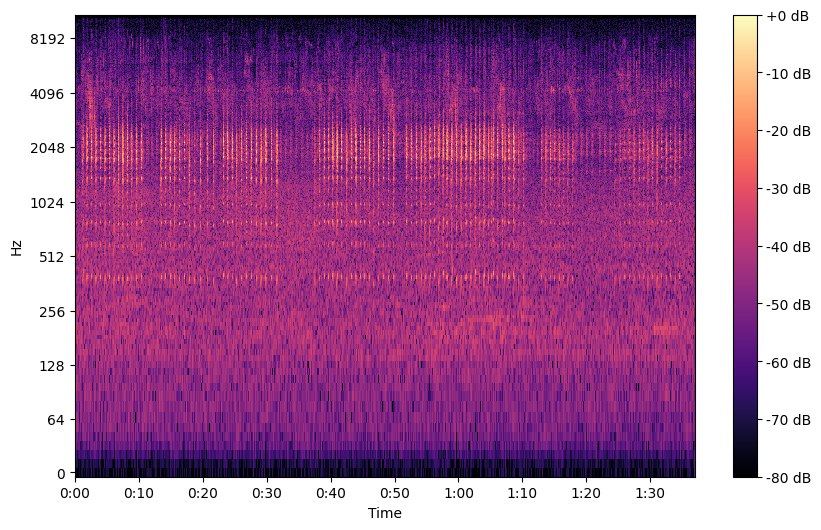

In [51]:
sonograma(mallar3)

In [56]:
y, sr = librosa.load(brnowl)
time = np.arange(0, len(y)) / sr

# Crear la figura interactiva
fig = go.FigureWidget()

# Agregar la onda de audio a la figura
trace = go.Scatter(x=time, y=y, mode='lines', name='Onda de Audio')
fig.add_trace(trace)

fig.update_layout(
    title='Onda de Audio Interactiva',
    xaxis_title='Tiempo (s)',
    yaxis_title='Amplitud',
    showlegend=True
)

FigureWidget({
    'data': [{'mode': 'lines',
              'name': 'Onda de Audio',
              'type': 'scatter',
              'uid': '35acf518-7b74-4949-8c7b-274aa16276da',
              'x': array([0.00000000e+00, 4.53514739e-05, 9.07029478e-05, ..., 1.33998639e+01,
                          1.33999093e+01, 1.33999546e+01]),
              'y': array([ 9.1288375e-06, -7.0340488e-06,  6.0502798e-06, ..., -1.8077588e-03,
                          -1.2035810e-03, -9.2997018e-04], dtype=float32)}],
    'layout': {'showlegend': True,
               'template': '...',
               'title': {'text': 'Onda de Audio Interactiva'},
               'xaxis': {'title': {'text': 'Tiempo (s)'}},
               'yaxis': {'title': {'text': 'Amplitud'}}}
})

### Distribución Geográfica (MAPA)

In [52]:
import plotly.express as px
from IPython.display import IFrame, display, HTML
import chart_studio.plotly as py
import plotly.graph_objects as go

In [53]:
Sub_data['texto'] = Sub_data['Nombre_cientifico'] + '<br>' + Sub_data['Nombre_comun'] + '<br>' + Sub_data['tiempo']
especie_color = {"Tyto alba": "#E0243F",
                "Actitis hypoleucos": "#FFD700",
                 "Passer domesticus": "#CF56E5",
                 "Anas platyrhynchos":"#17B682",
                 "Cardinalis cardinalis": "#E6A209",
                 "Alauda arvensis":"#EC223F"}
Sub_data['color'] = Sub_data['Nombre_cientifico'].map(especie_color)


En el mapa se puede observar, que la especie norcar se encuentra distribuida alrededor de México, Estados Unidos y Hawaii.

La especie skylar, se encuentra distribuida principalmente por Europa, con una presencia reducida en algunos países asiáticos, Australia y en algunos puntos de Estados Unidos

Para el caso de la especie mallar3, se encuentra distribuida principalmente por Europa, con una presencia reducida en algunos países asiáticos, como Japón, Nueva Zelanda, Estados Unidos y Colombia.

La especie houspa tiene presencia en varios puntos de todo el continente Americano, también en Europa, parte de Asia, el continente Africano, Australia y Nueva Zelanda.

La especie comsan se puede observar en gran parte de Europa, algunos puntos de África y Asia.

Finalmente, la especie brnowl, se encuentra principalmente en Europa, con presencia en algunos puntos del continente Americano, el continente Africano y en algunos países de Asia.

In [57]:
fig = go.FigureWidget()
fig.add_trace(go.Scattergeo(lon = Sub_data['longitud'], 
                            lat = Sub_data['latitud'], 
                            text = Sub_data['texto'],
                            mode = 'markers',
                            marker=dict(color=Sub_data['color'], size=3)))

fig.update_layout(
    title = 'Distribución geográfica de las aves',
    geo_scope='world',
    geo=dict(showcoastlines=True,showocean=True, showframe=False, coastlinecolor="black",
             showcountries=True,showland = True, countrywidth = 0.7,
             landcolor = '#E3DCC3',lakecolor = '#4EA3E1',
             oceancolor ="lightblue" ,projection_type="orthographic",
             lonaxis = dict(showgrid = True,gridcolor = 'white',gridwidth = 0.3),
             lataxis = dict(showgrid = True,gridcolor = 'white',gridwidth = 0.3)),
    title_x=0.5)
fig.show()